# Hakai Instrument Water Profiles Analysis
We present here an example of how to use the Jupyter Notebook environment to visually review some Hakai data.

---
# Let's first install some missing packages
Google Colab servers have already install a number of commonly used python packages like Numpy and Pandas. But some are however missing. To install a package through the notebook environment, you simply need to add the `!` in front of the installation command that you will use normally in a command line. To install a package available on the python package management system `pip`, use the following command:

``` python
!pip install hakai-api
```

If you want to install, a package not available on pip but on GitHub as an example, use the following example:

``` python
!pip install git+https://github.com/HakaiInstitute/hakai-api-client-python.git
```
To install a specific branch of the repository, just add `@[branch name] ` ex: `@development`.

Let's go ahead and install the[ hakai api python client](https://github.com/HakaiInstitute/hakai-api-client-python) which will be handy to retrieve Hakai's data from the database: 

In [216]:
# Install the hakai api python client:
!pip install hakai-api
!pip install erddapy

## Import Packages
Installing packages locally is not enough to be able to use the package in python. You need also to import them in your present notebook (*.ipyb) or python script (*.py). 

Think of it, as installing the package is having it in your garage, importing it brings on your workbench, ready to be use.

We will import on top of the hakai-api package the following:
* [Pandas](https://pandas.pydata.org/docs/user_guide/10min.html): Powerfull package to handle table of data *(Excel on steroid)*.
* Folium: Make some nice maps
* [Plotly](https://plotly.com/python/plotly-express/): Interactive plots
* [Seaborn](https://seaborn.pydata.org/): Plotting tool that can easily present statistical results
* [erddapy](https://ioos.github.io/erddapy/v0.9.0/): Useful package to interact with ERDDAP

In [217]:
# Let's import the Client module of the hakai api package
from hakai_api import Client

# Pandas is a really useful package to handle table of data, and we'll rename it pd, which is really commonly use online.
import pandas as pd

# Tool to create some maps
import folium
from folium.plugins import MarkerCluster

# Plotting tools
# Plotly is very easy to package to create interactive plots. The express 
#  component, as a set of high level powerful tools to generate nice and 
#  interactive plots in just one line. 
import plotly.express as px
import plotly.graph_objs as go

# Seaborn
import seaborn as sbn

# erddapy
from erddapy import ERDDAP

---
# Download data


## What are we downloading
Let's download the processed CTD Profile downcast data for the QU39 station!

## Through the Hakai API with hakai-api

We won't spend too much time and how to use the hakai api. Have a look here for a more detailed description.

    For a list of the different endpoints avaiable go here.
    For a detail description of how to improve you query and add filters here.

IMPORTANT The very first time, it will ask you to give your google authorization to access the data. Click on the provided link and copy and paste the url given back in the box below.

### Hakai API with hakai-api

In [194]:
# Set a client
client = Client()

# Let's define the endpoints and filters of our query
endpoint = '/ctd/views/file/cast/data'
filter = 'station=QU39&limit=-1&direction_flag=d'
fields= ['hakai_id','device_sn','latitude','longitude','start_dt','depth',
         'pressure','temperature','salinity','dissolved_oxygen_ml_l']
if fieldnames:
    filter += '&fields=%s' % ','.join(fields)
# Make a data request for chlorophyll data
url = '%s/%s?%s' % (client.api_root, endpoint, filter)
response = client.get(url)

print(url) # https://hecate.hakai.org/api/eims/views/output/chlorophyll...
print('{0} records downloaded'.format(len(response.json())))

https://hecate.hakai.org/api//ctd/views/file/cast/data?station=QU39&limit=-1&direction_flag=d&fields=hakai_id,device_sn,latitude,longitude,start_dt,depth,pressure,temperature,salinity,dissolved_oxygen_ml_l
111396 records downloaded


### Pandas DataFrame
JSON is nice, but let's convert all this to a more useful Pandas DataFrame and show me the first 5 lines

In [221]:
df = pd.DataFrame(response.json())
df.head()

,hakai_id,device_sn,latitude,longitude,start_dt,depth,pressure,temperature,salinity,dissolved_oxygen_ml_l
0,018066_2021-03-09T17:28:49.667Z,18066,50.031542,-125.099809,2021-03-09T17:29:02.333Z,0.827,1,7.2546,28.4414,7.2569
1,018066_2021-03-09T17:28:49.667Z,18066,50.031542,-125.099809,2021-03-09T17:29:02.333Z,1.885,2,7.2572,28.6234,6.9470
2,018066_2021-03-09T17:28:49.667Z,18066,50.031542,-125.099809,2021-03-09T17:29:02.333Z,2.895,3,7.2916,28.6304,6.8666
3,018066_2021-03-09T17:28:49.667Z,18066,50.031542,-125.099809,2021-03-09T17:29:02.333Z,3.938,4,7.3181,28.6865,6.8535
4,018066_2021-03-09T17:28:49.667Z,18066,50.031542,-125.099809,2021-03-09T17:29:02.333Z,4.996,5,7.2748,28.7071,6.8486


In [222]:
# Let's convert them to a smart datetime format, which makes plotting and
#  dealling with time variables a lot easier.
df['time'] = pd.to_datetime(df['start_dt'])
df['time'].head()

0   2021-03-09 17:29:02.333000+00:00
1   2021-03-09 17:29:02.333000+00:00
2   2021-03-09 17:29:02.333000+00:00
3   2021-03-09 17:29:02.333000+00:00
4   2021-03-09 17:29:02.333000+00:00
Name: time, dtype: datetime64[ns, UTC]

## Hakai ERDDAP
Another way to get the data is to download it through [Hakai ERDDAP](https://catalogue.hakai.org/erddap/index.html). We will download the data from the [Hakai Water Properties Instrument Research dataset](https://catalogue.hakai.org/erddap/tabledap/HakaiWaterPropertiesInstrumentProfileResearch.html)

In [243]:
erddap_server = 'https://catalogue.hakai.org/erddap'
dataset_id = 'HakaiWaterPropertiesInstrumentProfileResearch'

e = ERDDAP(
    server=erddap_server, # "NOAA IOOS NGDAC (National Glider Data Assembly Center)"
    protocol="tabledap",
    response="csv",
)
e.dataset_id = dataset_id
e.variables=['hakai_id','device_sn','latitude','longitude','time','depth',
         'pressure','temperature','salinity','dissolved_oxygen_ml_l']

# Select only QU39
e.constraints = {
    "station=": "QU39",
}

# All this above essentially creates the search url
search_url = e.get_download_url()
print(search_url)

# You can download directely the data with the e.to_pandas() method
df=e.to_pandas()
## IMPORTANT e.to_pandas() will add the units in each column names and won't compatible with the text below.

https://catalogue.hakai.org/erddap/tabledap/HakaiWaterPropertiesInstrumentProfileResearch.csv?hakai_id,device_sn,latitude,longitude,time,depth,pressure,temperature,salinity,dissolved_oxygen_ml_l&station="QU39"


In [245]:
# You could also generate you're own query by using the ERDDAP interface and then download the csv format with Pandas
df = pd.read_csv(search_url,
                 skiprows=(1,) # ERDDAP puts the units  in the second line of the csv, we'll skip that
                 )


In [246]:
# Convert time variable to a datetime
df['time'] = pd.to_datetime(df['time'])

# Generate more variables with our dataframe


In [247]:
# Not you can easily extract the year and month 
df['year'] = df['time'].dt.year
df['month'] = df['time'].dt.month


In [248]:
# Let's sort the data by time and depth
df = df.sort_values(by=['time','depth'])

# Let's make some plots
Let's start by plotting all the temperature data over time and depth:


## Maps with Folium

In [249]:
# Let's create a map centrered around QU39 average location
m = folium.Map(location=df[['latitude','longitude']].mean().values,
               zoom_start=10,
               tiles="Stamen Terrain")

# Let's add a pin for each single profile available
marker_cluster = MarkerCluster().add_to(m)
for row in df[['latitude','longitude','hakai_id']].dropna().drop_duplicates().itertuples():
    folium.Marker(location=[row.latitude,row.longitude],popup=row.hakai_id).add_to(marker_cluster)

# Show me the map
m

## Interactive plots with Plotly

### Color Scatter Plot

In [251]:
# Make the plot
fig = px.scatter(
    df, 
    x='time',
    y='depth',
    color='temperature', 
    hover_data=['hakai_id','device_sn'],
    range_color=(6, 12)
    )

# We like the depth to be reversed!
fig.update_yaxes(autorange='reversed')

# Show the figure
fig

### Animated Profile Plot

In [257]:
# Let's make a animation of the same plot but temperature along the x axis
# Make the plot
fig = px.scatter(df, x='temperature',y='pressure',color='salinity',
                 animation_frame=df['time'].astype(str))

# We like the depth to be reversed with!
fig.update_yaxes(autorange='reversed')
fig.update_xaxes(range=[6, 15])
fig.update_yaxes(range=[250, 0])

# Show the figure
fig

### Box Plot

In [258]:
# Statistic plots
# Let's have a look at the average value recorded between 200 to 250 for
# each profiles and get a box plot for each month and year.
df_range = df.query('200<depth<250').groupby('hakai_id').mean().sort_values(['year'])

fig = px.box(
    df_range, 
    x='month',
    y='temperature',
    color='year'
    )
# Show the figure
fig

### Contour Plot

In [271]:
# Interactive contour plot
# We'll make a pivot on the data to get each rows along depth
df_pivot = pd.pivot_table(df,values='temperature',
                          index='pressure',
                          columns='time',
                          aggfunc='mean')

fig = go.Figure(data =
    go.Contour(z=df_pivot.values,
               x=df_pivot.columns,
               y=df_pivot.index.values,
               colorbar=dict(title='Temperature', titleside='right'),
               colorscale='RdYlBu',
               ncontours=20,
               contours_coloring='heatmap',
               zmin=7,
               zmax=13,
               reversescale=True, # Red= Hot, Blue= Cold
               connectgaps=True
              ))
              
fig.update_yaxes(range=[250,0], title='Pressure (dBar)')

fig

# Seaborn
Plotly and Seaborn are very similar but there's sometimes some slight differences. 

Seaborn is generally better for making figures for reports.

Plotly is more for web interactive figures.

Both have pros and cons!

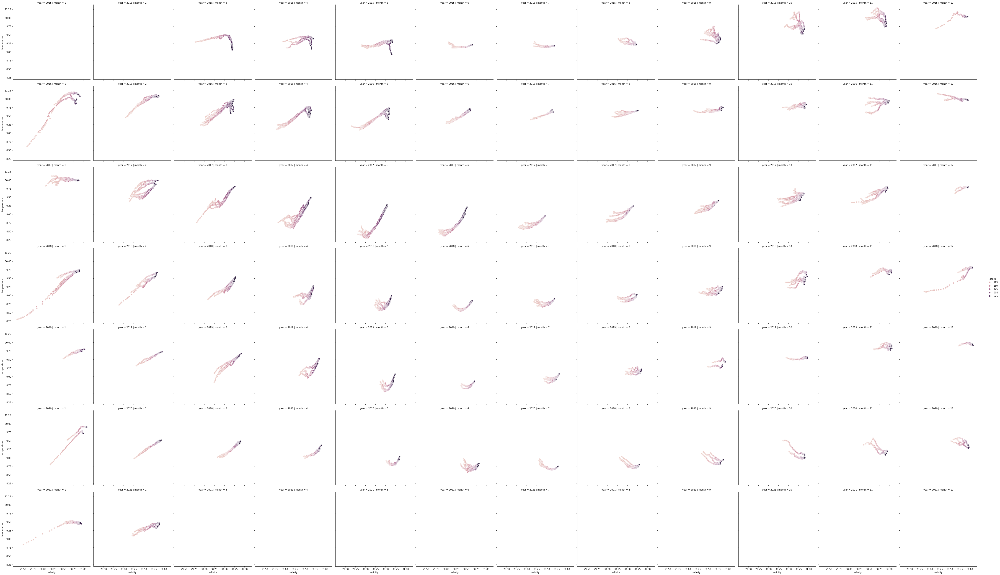

In [273]:
# Let's plot the average monthly salinity at 100-150m 
df_selected = df.query('100<depth<250')
sbn.relplot(data=df_selected,x='salinity',y='temperature',hue='depth',col='month',row='year',)

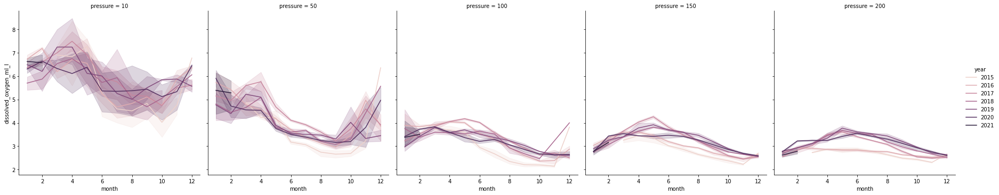

In [282]:
# Let's plot the average monthly salinity at 100-150m 
df_selected = df[df['pressure'].isin([10,50,100,150,200])]
sbn.relplot(data=df_selected,x='month',y='dissolved_oxygen_ml_l',hue='year',col='pressure',kind='line')

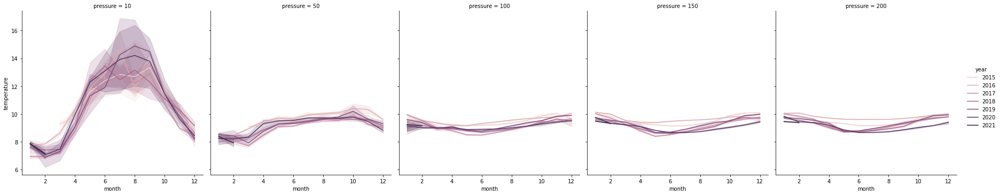

In [283]:
# Plot the same for temperature
sbn.relplot(data=df_selected,x='month',y='temperature',hue='year',col='pressure',kind='line')